In [1]:
using Pkg

projectdir_static = dirname(Base.active_project())

projectdirx(args...) = joinpath(projectdir_static, args...)

# Generate functions to access the path of default subdirectories.
for dir_type ∈ ("data", "src", "plots", "scripts", "papers")
    function_name = Symbol(dir_type * "dirx")
    @eval begin
        $function_name(args...) = projectdirx($dir_type, args...)
    end
end

using DrWatson

@quickactivate "TissueRigidity"
 
projectname()

"TissueRigidity"

In [2]:
using DifferentialEquations
using StatsBase
using CairoMakie
using XLSX
using DataFrames
using Optimization, OptimizationPolyalgorithms, SciMLSensitivity,OptimizationOptimJL,OptimizationBBO,OptimizationNOMAD

┌ Warning: Error requiring `Enzyme` from `LinearSolve`
│   exception = (LoadError("/Users/boothh/.julia/packages/LinearSolve/qCLK7/ext/LinearSolveEnzymeExt.jl", 1, ArgumentError("Package LinearSolve does not have Enzyme in its dependencies:\n- You may have a partially installed environment. Try `Pkg.instantiate()`\n  to ensure all packages in the environment are installed.\n- Or, if you have LinearSolve checked out for development and have\n  added Enzyme as a dependency but haven't updated your primary\n  environment's manifest file, try `Pkg.resolve()`.\n- Otherwise you may need to report an issue with LinearSolve")), Union{Ptr{Nothing}, Base.InterpreterIP}[Ptr{Nothing} @0x000000011e6687dc, Ptr{Nothing} @0x000000011e668a26, Ptr{Nothing} @0x000000010b3276bd, Ptr{Nothing} @0x000000010b35ea6d, Ptr{Nothing} @0x000000010b35d84f, Ptr{Nothing} @0x000000010b35e039, Ptr{Nothing} @0x000000010b35dcad, Ptr{Nothing} @0x000000010b35eef5, Ptr{Nothing} @0x0000000127be6c41, Ptr{Nothing} @0x000000010b

In [89]:
include(srcdirx("Plotting&Utility.jl"))
include(srcdirx("FittingFunctions.jl"))
# include(srcdirx("old/FittingFunctions_old_cmax.jl"))

include(srcdirx("NodalLefty_E.jl"))

exp_name = "NodalLefty_RelayDiffusion_Optimal"

include(srcdirx("ExperimentSetups/" * exp_name * ".jl"))

include(scriptsdirx("LoadData.jl"));

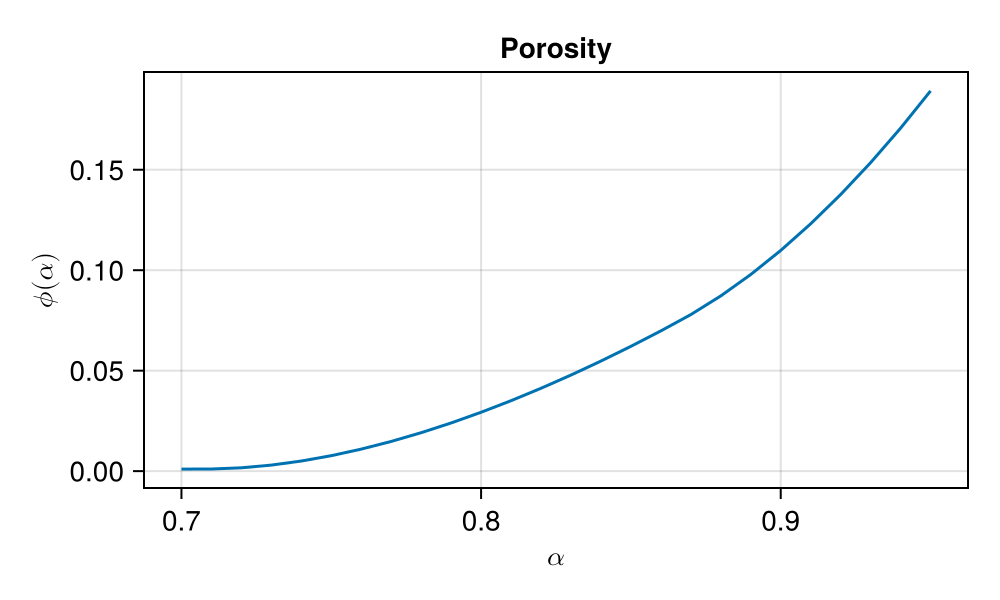

In [4]:
α_range = 0.7:0.01:0.95

fig = Figure(size = (500,300))
ax1 = Axis(fig[1,1],title = "Porosity",ylabel = L"\phi(\alpha)",xlabel = L"\alpha")

lines!(ax1, α_range,[ϕ(α) for α in α_range])

fig

In [70]:
pv_orig = [DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0]
# pv_orig = load(datadirx() * "/sims/NodalLefty_DiffusionDominated_OptParmas.jld2")["OptimalParam"][3]

p_orig,p_cp_orig,p_lm_orig = get_params(pv_orig)

tspan = (0,Inf)

u0 = ones(Nc,4)

u0[:,1] .= 1e-10
u0[:,2] .= 1e-10
u0[:,3] .= 0.
u0[:,4] .= α0

prob = ODEProblem(nodal_lefty_spatial_diff!,u0,tspan,p_orig)

lb = copy(pv_orig)
ub = copy(pv_orig)

lb[1:2] = 0.9 .* lb[1:2]
ub[1:2] = 1.1 .* ub[1:2]

lb[3:end] = (1 - γ) .* lb[3:end]
ub[3:end] = (1 + γ) .* ub[3:end];

In [6]:
orig_metrics = get_summary_metrics(pv_orig,prob,data,alpha_data,0.2)

(wt_t0 = 797.3569753305505, cp_t0 = 1395.3747068284633, wt_xMax = 46.15384615384615, cp_xMax = 83.27759197324414, lm_xMax = 300.0, wt_d0 = 0.08695652173913043, cp_d0 = 0.30120481927710846, lm_d0 = 1.0, xmax_peak_ratio = 1.7499999999999998, xmax_mse = (0.10082264371041091, 0.4829101648811286), xmax_mse_half = (0.10082264371041091, 0.047754335847695846), alpha_mse = 0.004449551705123763, cp_lprod_t0 = 641.7167248906533, wt_lprod_t0 = 507.62666297320334, retcodes = (SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated))

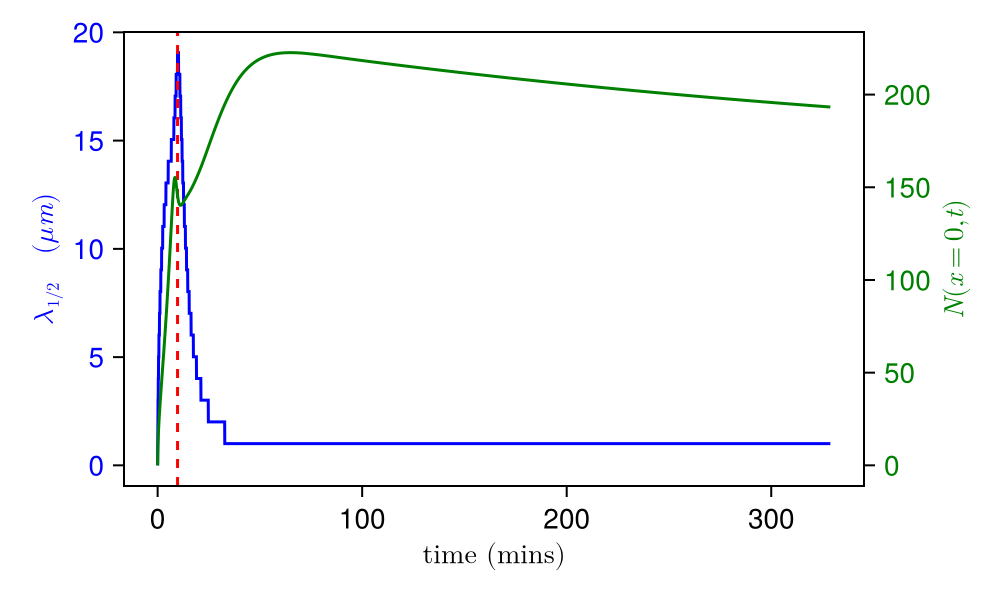

In [7]:
fig = Figure(size = (500,300))

ax = Axis(fig[1,1], xlabel = L"\text{time (mins)}", ylabel= L"\lambda_{1/2} \quad (\mu m)",ygridvisible = false,xgridvisible = false,ylabelcolor = :blue,yticklabelcolor = :blue)
ax_N = Axis(fig[1,1], xlabel = L"\text{Rescaled time, t}", ylabel= L"N(x=0,t)", yaxisposition = :right,ylabelcolor = :green,yticklabelcolor = :green,ygridvisible = false,xgridvisible = false,xticksvisible = false)

hidexdecorations!(ax_N)

sol = solve(prob, p = p_orig, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

N_samp = 5000

λ_trange = LinRange(0.,sol.t[end],N_samp)

N0t = [sol(t)[1,1] for t in λ_trange]

λhalf,λhalf_max_t = get_lambda_half(sol,λ_trange)

c_max = maximum(sol(λhalf_max_t)[:,1])

lines!(ax,λ_trange ./ 60 ,λhalf,color = :blue)

lines!(ax_N,λ_trange ./ 60 ,N0t, color = :green)

vlines!(ax,λhalf_max_t / 60, color = :red, linestyle = :dash)

save(plotsdir(exp_name * "/OrigFits/LambdaHalfOverT.pdf"),fig)

fig

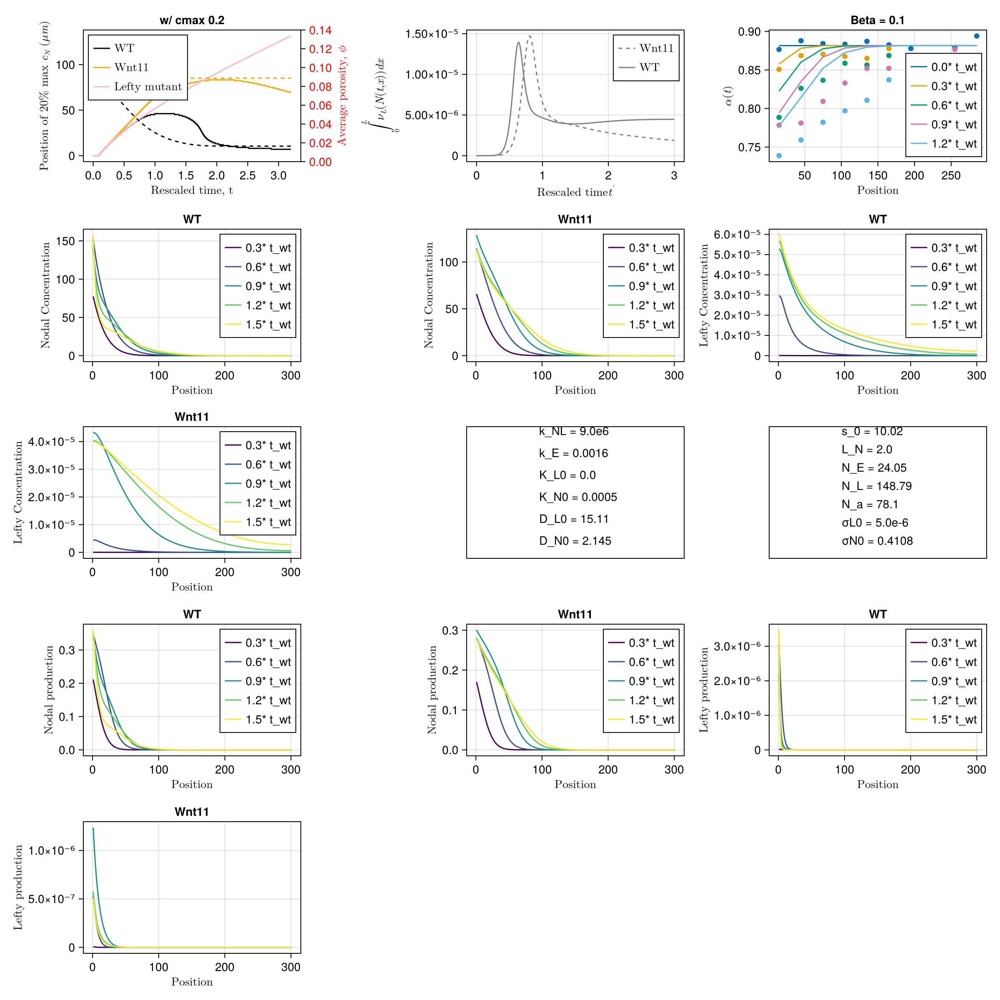

In [8]:
fig = Figure(size = (1200,1200))

# fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,2*kE,0.5*kNL,σN0,0.9*σL0,1.2*Na,NL,NE,LN,s0],prob)

# fig = plot_summary!(fig,[DN0,DL0,0.5*kN0,kL0,2*kE,0.5*kNL,σN0,0.7*σL0,1.5*Na,NL,0.3*NE,0.5*LN,s0],prob)

fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0],prob)

save(plotsdir(exp_name * "/OrigFits/Summary_orig.pdf"),fig)

fig


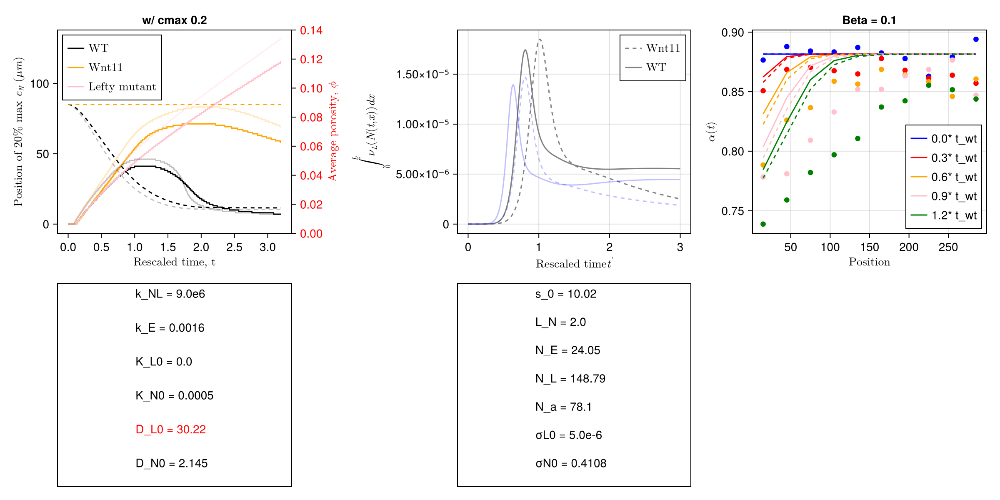

In [41]:
p_try = copy(pv_orig)
i = 2
pt = 2.
p_try[i] = p_try[i]*pt

fig = Figure(size = (1200,600))

plot_summary_compare!(fig,p_try,prob)

fig

In [44]:
for i in 1:length(pv_orig)
    print(i)
    for pt in [0.8,1.2]
        # fig = Figure(size = (1200,1200))
        p_try = copy(pv_orig)
        p_try[i] = p_try[i]*pt

        fig = Figure(size = (1200,600))
        plot_summary_compare!(fig,p_try,prob)
        
        save(plotsdir(exp_name * "/Perturb/08/" * p_names_string[p_names[i]] * "_" * string(pt) * ".pdf"),fig)
    end
end

12

34

56

78

910

1112

13

In [43]:
for i in 1:length(pv_orig)
    print(i)
    for pt in [0.5,2.]
        fig = Figure(size = (1200,1200))
        p_try = copy(pv_orig)
        p_try[i] = p_try[i]*pt

        plot_summary!(fig,p_try,prob)
        
        save(plotsdir(exp_name * "/Perturb/05Complete/" * p_names_string[p_names[i]] * "_" * string(pt) * ".pdf"),fig)
    end
end

12

34

56

78

910

1112

13

In [64]:
# fig = Figure(size = (1200,1200))

# # fig = plot_summary!(fig,[DN0,DL0,kN0,kL0,2*kE,0.5*kNL,σN0,0.9*σL0,1.2*Na,NL,NE,LN,s0],prob)

# # fig = plot_summary!(fig,[DN0,DL0,0.5*kN0,kL0,2*kE,0.5*kNL,σN0,0.7*σL0,1.5*Na,NL,0.3*NE,0.5*LN,s0],prob)

# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,σL0,Na,1.2*NL,NE,3*LN,s0],prob)

# # save(plotsdir(exp_name * "/OptFits/PeturbHyp_kN.pdf"),fig)

# fig

In [69]:
orig_metrics

(wt_t0 = 797.3569753305505, cp_t0 = 1395.3747068284633, wt_xMax = 46.15384615384615, cp_xMax = 83.27759197324414, lm_xMax = 300.0, wt_d0 = 0.08695652173913043, cp_d0 = 0.30120481927710846, lm_d0 = 1.0, xmax_peak_ratio = 1.7499999999999998, xmax_mse = (0.10082264371041091, 0.4829101648811286), xmax_mse_half = (0.10082264371041091, 0.047754335847695846), alpha_mse = 0.004449551705123763, cp_lprod_t0 = 641.7167248906533, wt_lprod_t0 = 507.62666297320334, retcodes = (SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated, SciMLBase.ReturnCode.Terminated))

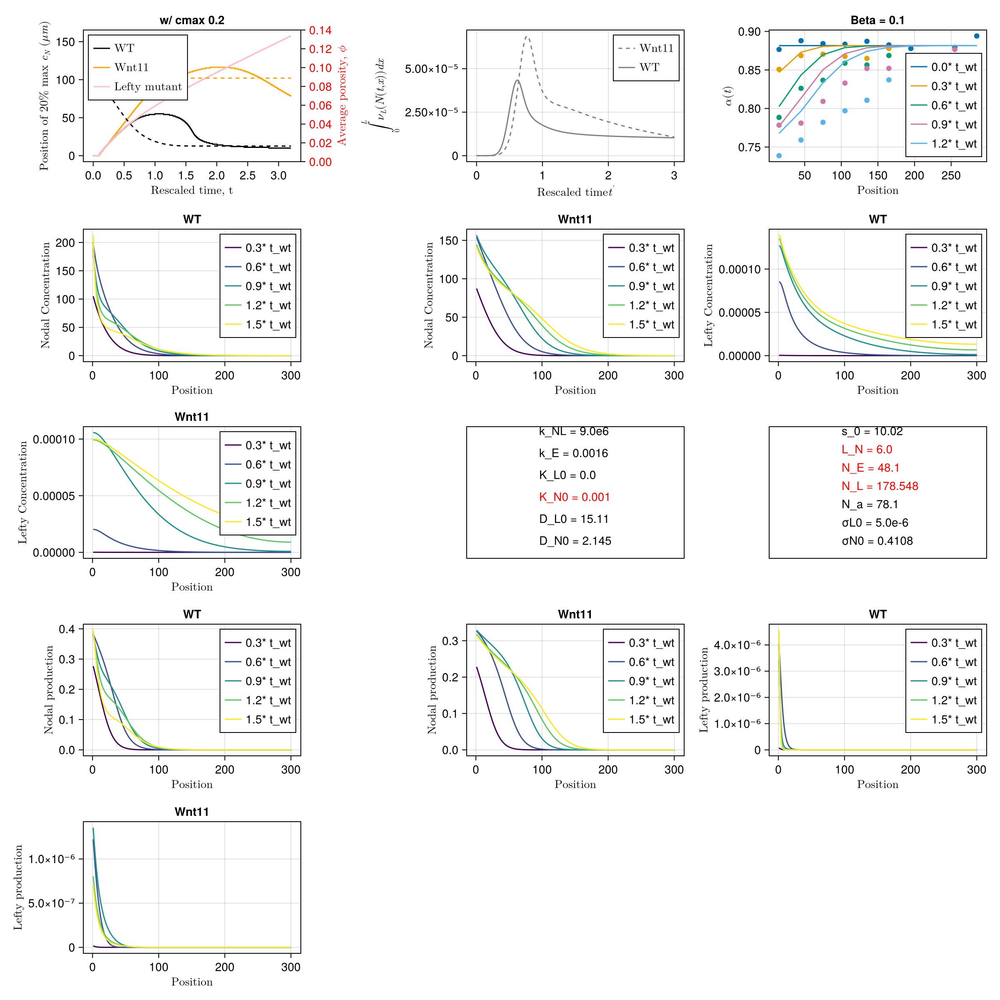

In [65]:
fig = Figure(size = (1200,1200))
 
# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,2*σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

# save(plotsdir(exp_name * "/OptFits/PeturbHyp_kN_LN_NE.pdf"),fig)

fig

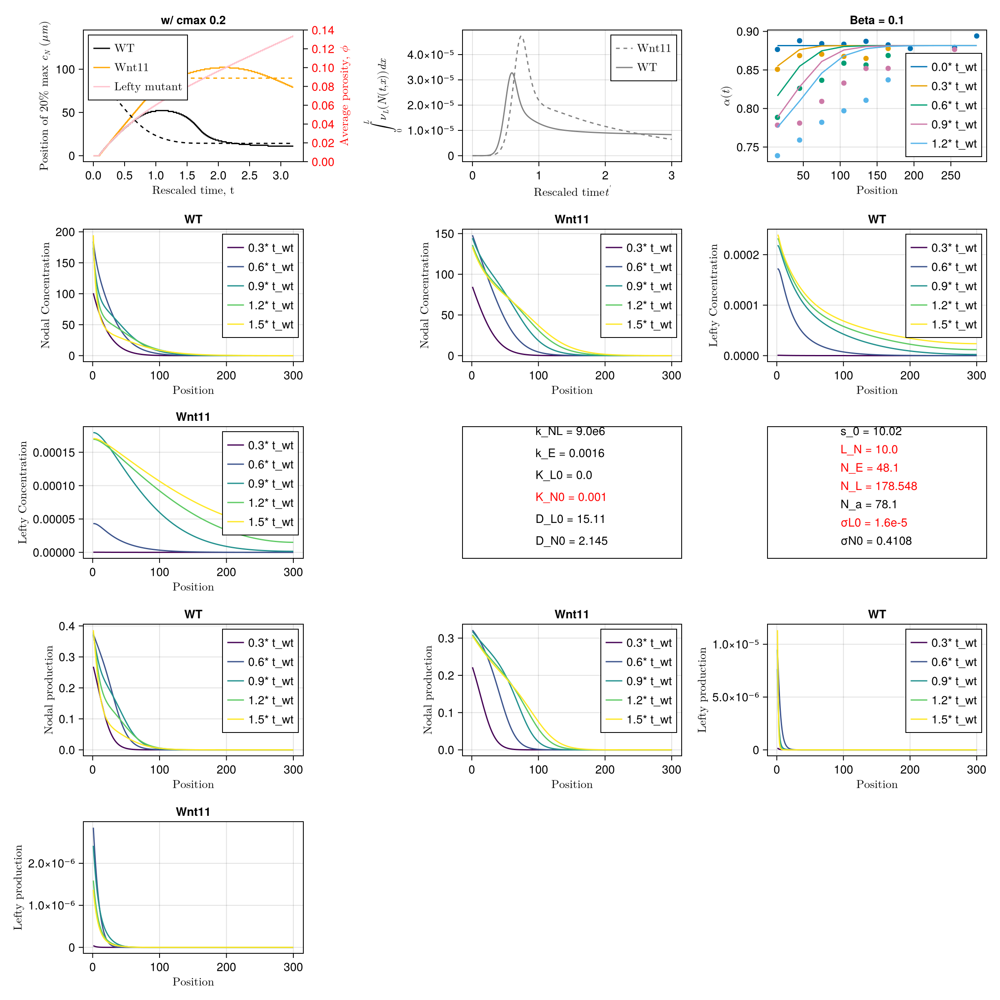

In [68]:
fig = Figure(size = (1200,1200))
 
# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,2*σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,3*σL0,Na,1.2*NL,2*NE,5*LN,s0],prob)  # best 

# save(plotsdir(exp_name * "/OptFits/PeturbHyp_kN_LN_NE.pdf"),fig)

fig

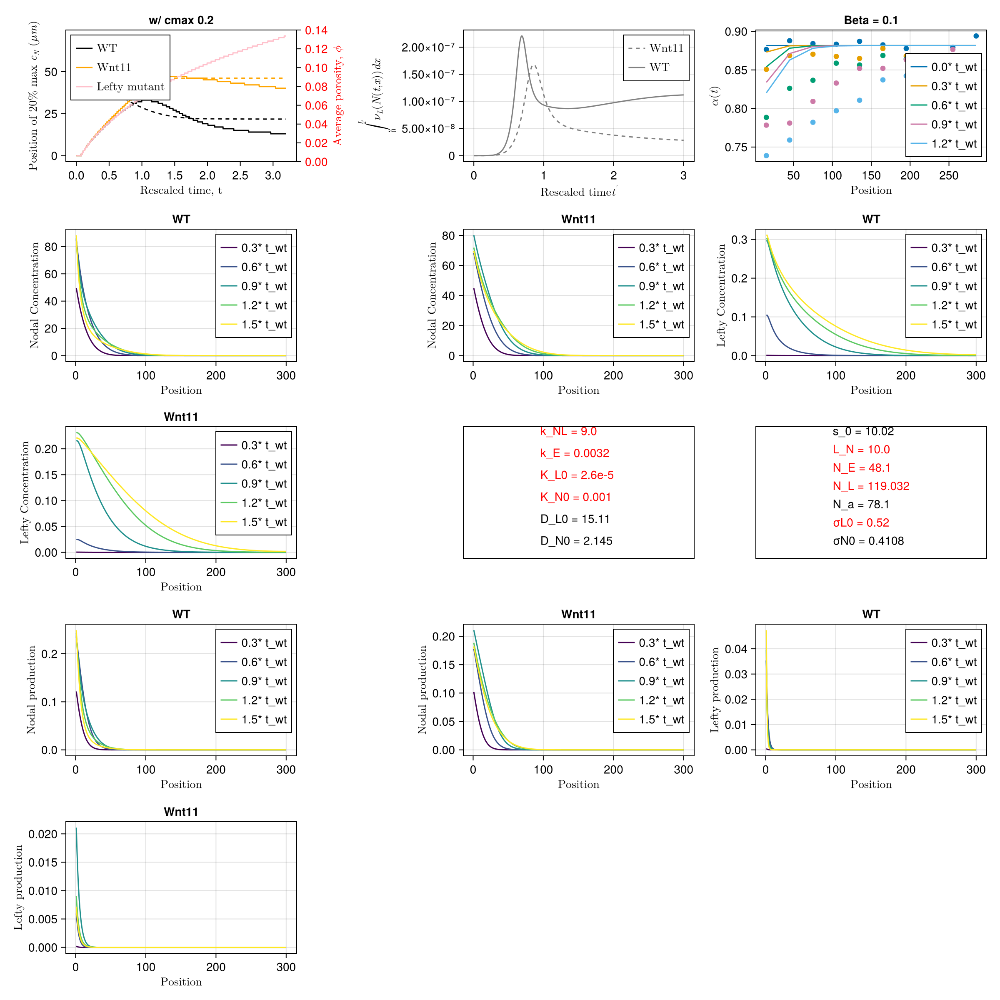

In [148]:
fig = Figure(size = (1200,1200))
 
# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,2*σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

# fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,1.2*NL,2*NE,5*LN,s0],prob)  # best 

# fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,2*NL,2*NE,3*LN,s0],prob)  # best 

fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,0.8*NL,2*NE,5*LN,s0],prob)  # best 

# save(plotsdir(exp_name * "/OptFits/AdjustKNL_relayoff.pdf"),fig)

fig

In [155]:
get_summary_metrics_cpset_safe([DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,0.8*NL,2*NE,5*LN,s0],prob,data,alpha_data,[0.2])

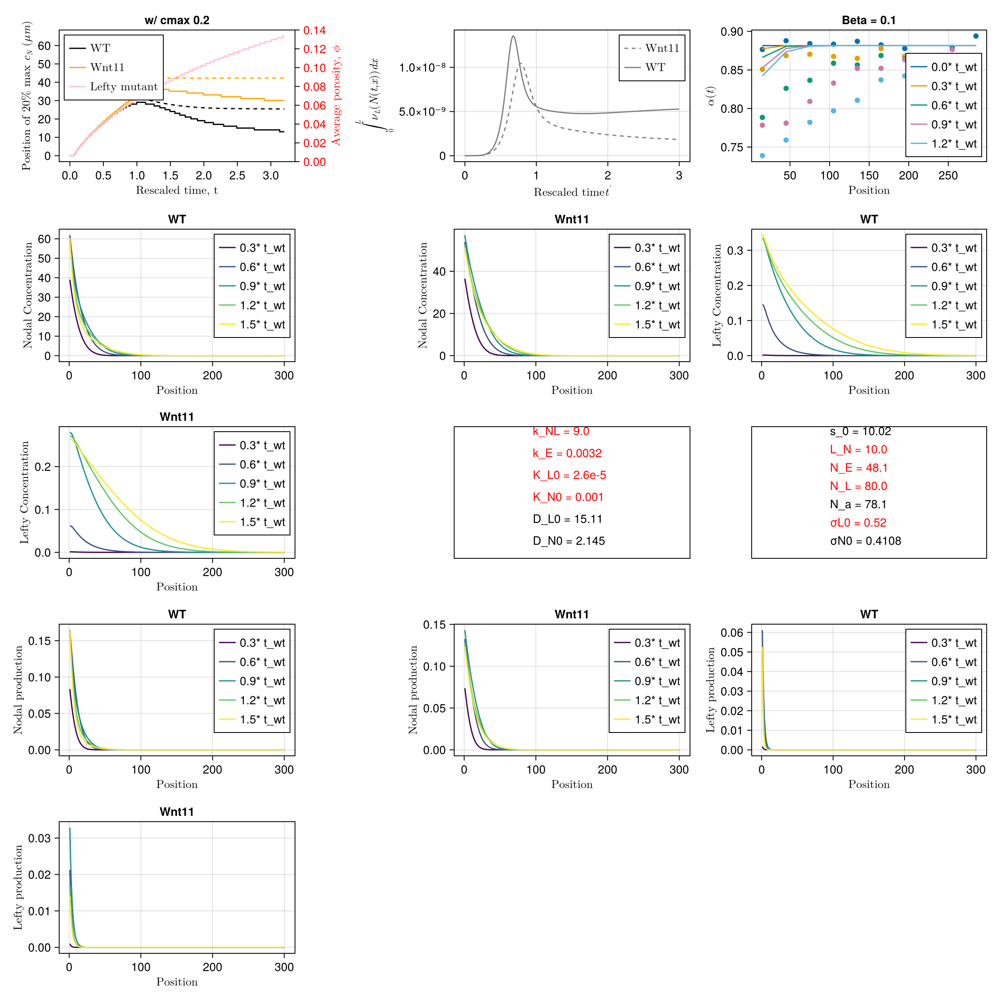

In [151]:
fig = Figure(size = (1200,1200))
 
# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,2*σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

# fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,1.2*NL,2*NE,5*LN,s0],prob)  # best 

# fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,2*NL,2*NE,3*LN,s0],prob)  # best 

fig = plot_summary!(fig,[DN0,DL0,2*kN0,100*kL0,2*kE,0.000001*kNL,σN0,100000*σL0,Na,80.,2*NE,5*LN,s0],prob)  # best 

# save(plotsdir(exp_name * "/OptFits/AdjustKNL_relayoff.pdf"),fig)

fig

In [152]:
save(plotsdir(exp_name * "/OptFits/AdjustKNL_NL80.pdf"),fig)

CairoMakie.Screen{PDF}


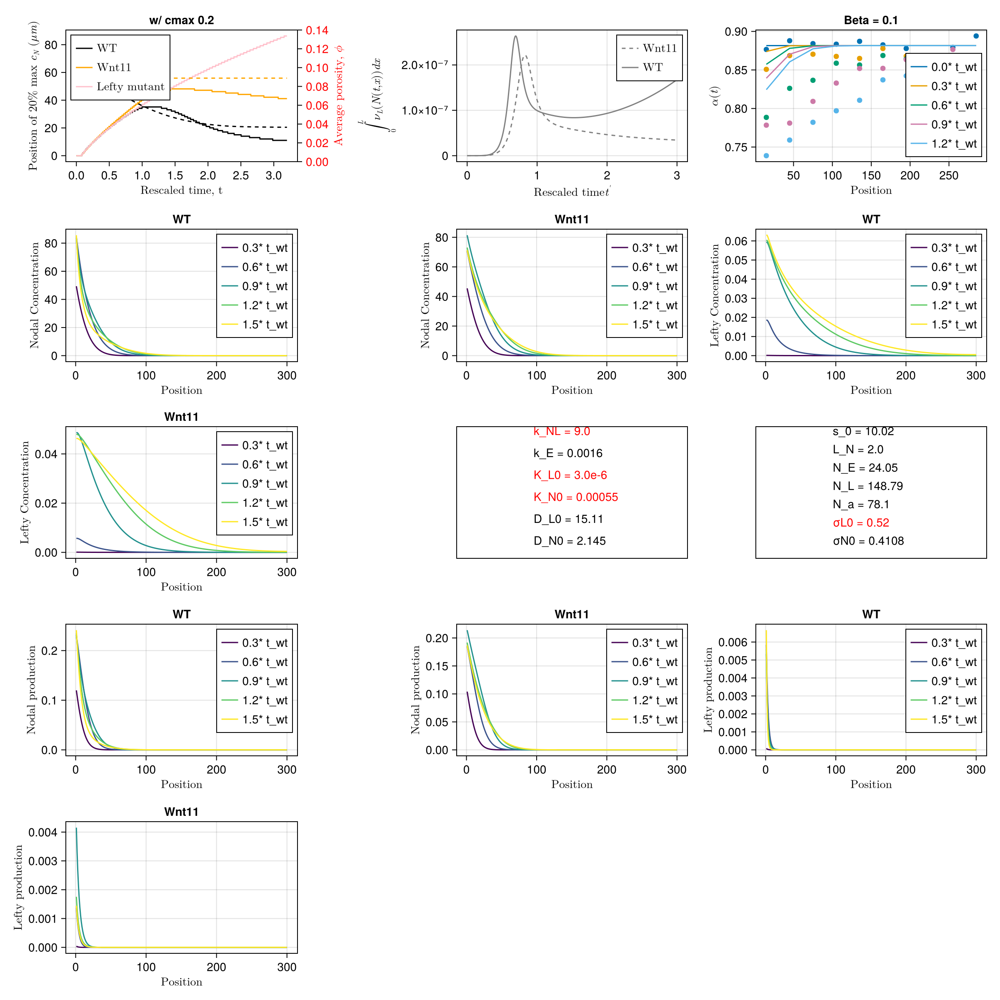

In [147]:
fig = Figure(size = (1200,1200))

fig = plot_summary!(fig,[DN0,DL0,1.1*kN0,10*kL0,kE,0.000001*kNL,σN0,100000*σL0,Na,NL,NE,LN,s0],prob)

# save(plotsdir(exp_name * "/OptFits/Adjust_KNL_1_reduceNL.pdf"),fig)

fig

In [140]:
save(plotsdir(exp_name * "/OptFits/Adjust_KNL_1.pdf"),fig)

CairoMakie.Screen{PDF}


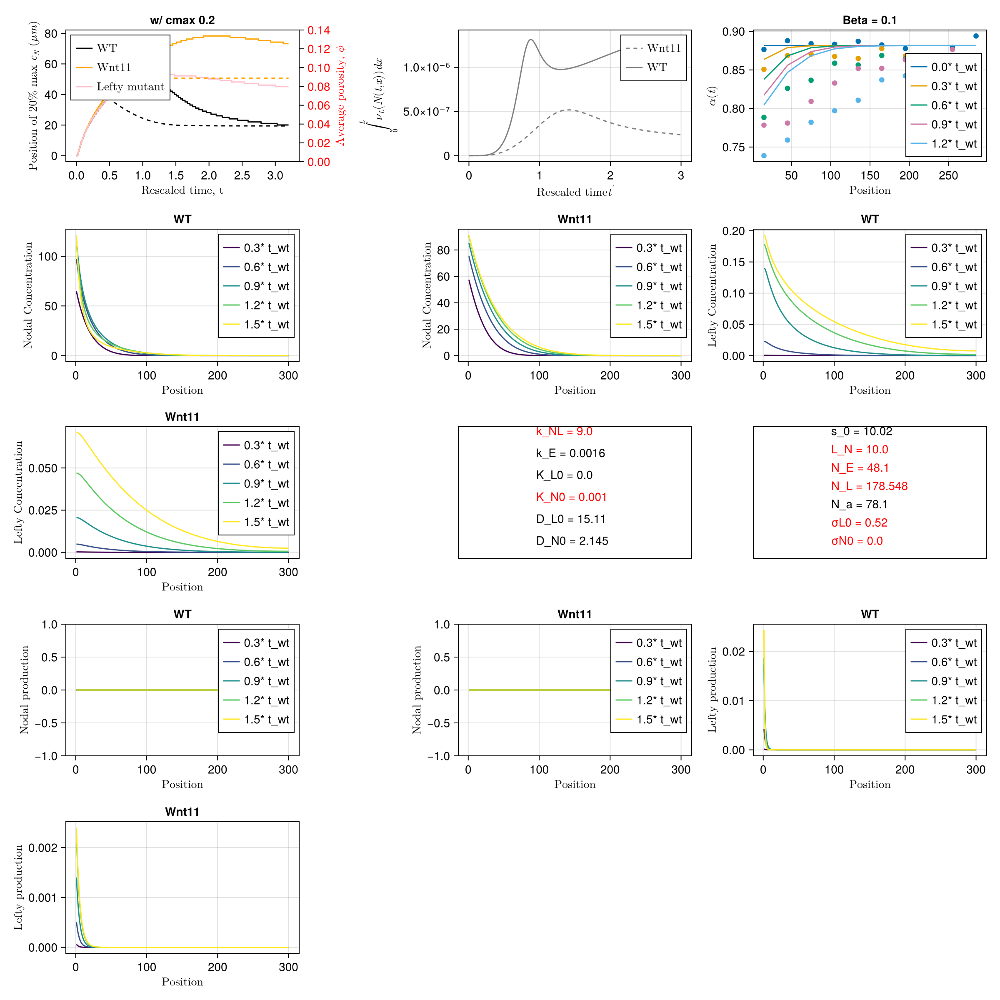

In [129]:
fig = Figure(size = (1200,1200))
 
# fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,kNL,σN0,2*σL0,Na,1.2*NL,2*NE,3*LN,s0],prob)  # best 

fig = plot_summary!(fig,[DN0,DL0,2*kN0,kL0,kE,0.000001*kNL,0.,100000*σL0,Na,1.2*NL,2*NE,5*LN,s0],prob)  # best 

# save(plotsdir(exp_name * "/OptFits/PeturbHyp_kN_LN_NE.pdf"),fig)

fig

In [103]:
j = 1.

lb_pow = copy(pv_orig)
ub_pow = copy(pv_orig)

lb_pow[1:2] = 0.9 .* lb_pow[1:2]
ub_pow[1:2] = 1.1 .* ub_pow[1:2]

# lb_pow[3:end] = 10^(-j) .* lb_pow[3:end]
# ub_pow[3:end] = 10^(j) .* ub_pow[3:end];

lb_pow[3:end] = 0.5 .* lb_pow[3:end]
ub_pow[3:end] = 2 .* ub_pow[3:end];

lb_pow[6] = 0
ub_pow[6] = 100

lb_pow[end] = 4.99
ub_pow[end] = 5.01

lb_pow[7] = 0.9 * pv_orig[7]
ub_pow[7] = 1.1 * pv_orig[7]

lb_pow[3] = 0.9 * pv_orig[3]
ub_pow[3] = 1.1 * pv_orig[3]




0.00055

In [104]:
[DN0,DL0,kN0,kL0,kE,kNL,σN0,σL0,Na,NL,NE,LN,s0]

13-element Vector{Float64}:
   2.145
  15.11
   0.0005
   2.55e-7
   0.0016
   9.0e6
   0.4108
   5.2e-6
  78.1
 148.79000000000002
  24.05
   2.0
   5.01

In [105]:
p_orig

(DN0 = 2.145, DL0 = 15.11, kN0 = 0.0005, kL0 = 2.55e-7, kE = 0.0016, kNL = 9.0e6, σN0 = 0.4108, σL0 = 5.2e-6, Na = 78.1, NL = 148.79000000000002, NE = 24.05, mN = 2, mL = 8, mNL = 2, LN = 2.0, s0 = 5.01)

In [106]:
pv_start = copy(pv_orig)

pv_start[6] = 50.

50.0

In [107]:
ro,obj = optimize_params(prob,0.2,pv_start,lb_pow,ub_pow,100,false,false)

1   0.03491 


3   0.034872


4   0.034835


7   0.034826


11   0.034306


19   0.031947


22   0.02984 


25   0.026715


26   0.019795



BBE OBJ
27   0.01724 


29   0.016298


30   0.015605


31   0.015215


32   0.01441 


37   0.011251


49   0.004002


52   0.003758


53   0.00367 


54   0.003428


80   0.003383


81   0.003031


82   0.002438


A termination criterion is reached: Maximum number of blackbox evaluations (Eval Global) No more points to evaluate 100

Best feasible solution:     #9958 ( 2.3595 13.599 0.00045 1.275e-07 0.0008 50 0.45188 1.04e-05 39.05 74.395 48.1 1 5.01 )	Evaluation OK	 f =   0.00243800000000000006	 h =   0                     

Best infeasible solution:   Undefined.

Blackbox evaluations:         100
Total model evaluations:      12443
Cache hits:                   8
Total number of evaluations:  108


([2.3595, 13.599, 0.00045, 1.275e-7, 0.0008, 50.0, 0.45188, 1.04e-5, 39.05, 74.39500000000001, 48.1, 1.0, 5.01], 0.002438)

In [108]:
sim_tuple, sim_cp_tuple,_,sim_tuple_ro = get_params_ro(ro)

((DN0 = 2.3595, DL0 = 13.599, kN0 = 0.00045, kL0 = 1.275e-7, kE = 0.0008, kNL = 50.0, σN0 = 0.45188, σL0 = 1.04e-5, Na = 39.05, NL = 74.39500000000001, NE = 48.1, mN = 2, mL = 8, mNL = 2, LN = 1.0, s0 = 5.01), (DN0 = 2.3595, DL0 = 13.599, kN0 = 0.00045, kL0 = 1.275e-7, kE = 0.0008, kNL = 50.0, σN0 = 0.45188, σL0 = 1.04e-5, Na = 39.05, NL = 74.39500000000001, NE = 1.0e8, mN = 2, mL = 8, mNL = 2, LN = 1.0, s0 = 5.01), (DN0 = 2.3595, DL0 = 13.599, kN0 = 0.00045, kL0 = 1.275e-7, kE = 0.0008, kNL = 0.0, σN0 = 0.45188, σL0 = 1.04e-5, Na = 39.05, NL = 74.39500000000001, NE = 48.1, mN = 2, mL = 8, mNL = 2, LN = 1.0, s0 = 5.01), (DN0 = 2.3595, DL0 = 13.599, kN0 = 0.00045, kL0 = 1.275e-7, kE = 0.0008, kNL = 50.0, σN0 = 0.0, σL0 = 1.04e-5, Na = 39.05, NL = 74.39500000000001, NE = 48.1, mN = 2, mL = 8, mNL = 2, LN = 1.0, s0 = 5.01))

In [109]:
sim_tuple

(DN0 = 2.3595, DL0 = 13.599, kN0 = 0.00045, kL0 = 1.275e-7, kE = 0.0008, kNL = 50.0, σN0 = 0.45188, σL0 = 1.04e-5, Na = 39.05, NL = 74.39500000000001, NE = 48.1, mN = 2, mL = 8, mNL = 2, LN = 1.0, s0 = 5.01)

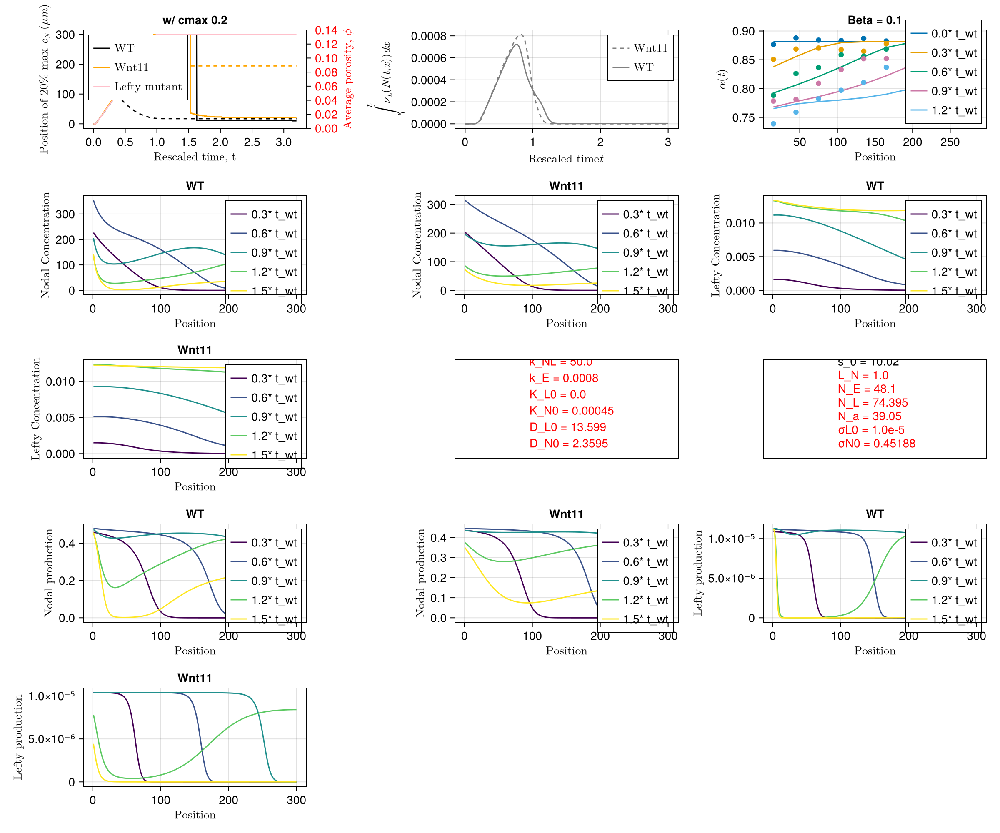

In [110]:
fig = Figure(size = (1200,1000))

fig = plot_summary!(fig,[sim_tuple[:DN0],sim_tuple[:DL0],sim_tuple[:kN0],sim_tuple[:kL0],sim_tuple[:kE],sim_tuple[:kNL],sim_tuple[:σN0],sim_tuple[:σL0],sim_tuple[:Na],sim_tuple[:NL],sim_tuple[:NE],sim_tuple[:LN],sim_tuple[:s0]],prob)

fig

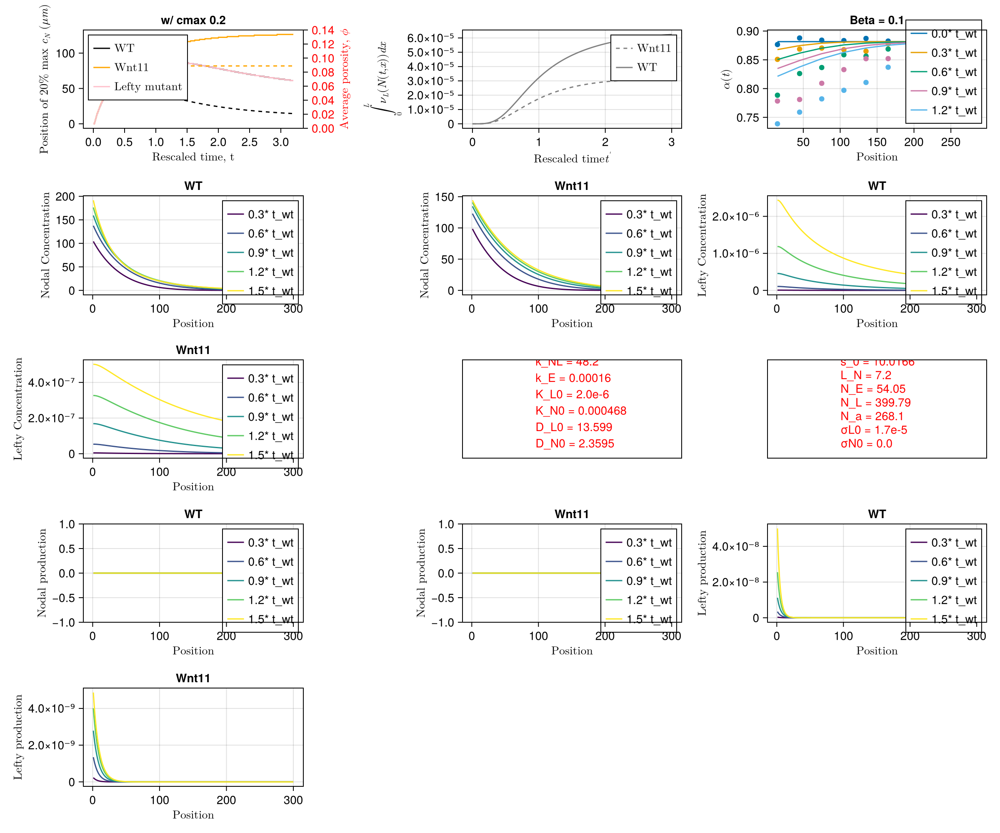

In [91]:
fig = Figure(size = (1200,1000))

fig = plot_summary!(fig,[sim_tuple_ro[:DN0],sim_tuple_ro[:DL0],sim_tuple_ro[:kN0],sim_tuple_ro[:kL0],sim_tuple_ro[:kE],sim_tuple_ro[:kNL],sim_tuple_ro[:σN0],sim_tuple_ro[:σL0],sim_tuple_ro[:Na],sim_tuple_ro[:NL],sim_tuple_ro[:NE],sim_tuple_ro[:LN],sim_tuple_ro[:s0]],prob)

fig

In [88]:
save(plotsdir(exp_name * "/OptFits/knL_Regime.pdf"),fig)

CairoMakie.Screen{PDF}


In [10]:
# for i in 1:length(pv_orig)
#     print(i)
#     for pt in [0.8,1.2]
#         fig = Figure(size = (1200,1200))
#         p_try = copy(pv_orig)
#         p_try[i] = p_try[i]*pt
#         plot_summary!(fig,p_try,prob)
#         save(plotsdir(exp_name * "/Perturb/08/" * p_names_string[p_names[i]] * "_" * string(pt) * ".pdf"),fig)
#     end
# end

12

34

56

78

910

1112

13

In [11]:
# for i in 1:length(pv_orig)
#     print(i)
#     for pt in [0.5,2.]
#         fig = Figure(size = (1200,1200))
#         p_try = copy(pv_orig)
#         p_try[i] = p_try[i]*pt
#         plot_summary!(fig,p_try,prob)
#         save(plotsdir(exp_name * "/Perturb/05/" * p_names_string[p_names[i]] * "_" * string(pt) * ".pdf"),fig)
#     end
# end

12

34

56

78

910

1112

13

In [ ]:
sim_data = load(datadirx() * "/sims/NodalLefty_RelayDiffusion_v2_CPSet_Sweep_RestrID.jld2")["Results"];
sim_data_p = load(datadirx() * "/sims/NodalLefty_RelayDiffusion_v2_CPSet_Sweep_RestrID.jld2")["Parameters"];
res_id = findall(x->length(x) == 3 ,sim_data)

sim_data = sim_data[res_id]
sim_data_p = sim_data_p[res_id];

In [ ]:
sim_data_02 = map(x->x[3],sim_data);

In [ ]:
# sim_data_02_c1_id = findall(x-> (x[:wt_xMax] < x[:cp_xMax]) & (x[:wt_lprod_t0 ] < x[:cp_lprod_t0]) & (x[:cp_d0] < 0.5) & (x[:inc_met] < 10.) ,sim_data_02); P1

sim_data_02_c1_id = findall(x-> (x[:wt_xMax] < x[:cp_xMax]) & (x[:wt_lprod_t0 ] < 5*x[:cp_lprod_t0]) & (x[:cp_d0] < 0.5) & (x[:inc_met] < 0.1) ,sim_data_02); #P2 - 22

# sim_data_02_c1_id = findall(x-> (x[:wt_xMax] < x[:cp_xMax]) & (x[:wt_lprod_t0 ] < x[:cp_lprod_t0]) & (x[:inc_met] < 0.1) ,sim_data_02);

In [ ]:
argmin(map(x->x[:alpha_mse],sim_data_02[sim_data_02_c1_id]))

In [ ]:
sim_data_02[sim_data_02_c1_id][187]

In [ ]:
p_vector = sim_data_p[sim_data_02_c1_id][187]

# p,p_cp,p_lm = get_params(p_vector)

# sol = solve(prob, p = p, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
# sol_cp = solve(prob, p = p_cp, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
# sol_lm = solve(prob, p = p_lm, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

# λ_trange = LinRange(0.,sol.t[end],N_samp)

# λhalf,λhalf_max_t = get_lambda_half(sol,λ_trange)

# c_max_wt = maximum(sol(λhalf_max_t)[:,1])

In [ ]:
# c_level = 0.2*c_max_wt

# t_grid = LinRange(0,sol.t[end],t_grid_N)

# level_x_wt = get_level_x(sol,c_level,t_grid);
# level_x_cp = get_level_x(sol_cp,c_level,t_grid)

# wt_t0 = t_grid[argmax(level_x_wt)];
# cp_t0 = t_grid[argmax(level_x_cp)];

# t_plot = LinRange(0,exp_times_times_norm[end],t_plot_N)

# level_x_wt_rescaled = get_level_x(sol,c_level,t_plot .* wt_t0)  
# level_x_cp_rescaled = get_level_x(sol_cp,c_level,t_plot .* wt_t0)
# level_x_lm_rescaled  = get_level_x(sol_lm,c_level,t_plot .* wt_t0)

# wt_xMax = maximum(level_x_wt_rescaled)
# cp_xMax = maximum(level_x_cp_rescaled)
# lm_xMax = maximum(level_x_lm_rescaled)

# wt_d0 = level_x_wt_rescaled[end] ./ wt_xMax
# cp_d0 = level_x_cp_rescaled[end] ./ cp_xMax
# lm_d0 = level_x_lm_rescaled[end] ./ lm_xMax

In [ ]:
sim_tuple, sim_cp_tuple,_ = get_params(p_vector)

In [ ]:
fig = Figure(size = (1200,1000))

fig = plot_summary!(fig,[sim_tuple[:DN0],sim_tuple[:DL0],sim_tuple[:kN0],sim_tuple[:kL0],sim_tuple[:kE],sim_tuple[:kNL],sim_tuple[:σN0],sim_tuple[:σL0],sim_tuple[:Na],sim_tuple[:NL],sim_tuple[:NE],sim_tuple[:LN],sim_tuple[:s0]],prob)

fig

In [ ]:
sol = solve(prob, p = sim_tuple, FBDF(),abstol = de_abstol,reltol = de_reltol, maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));
sol_cp = solve(prob, p = sim_cp_tuple, FBDF(),abstol = de_abstol,reltol = de_reltol,maxiters = 1e6,callback = TerminateSteadyState(1e-6,1e-4),isoutofdomain = (u,p,t) -> any(x->x<0, u));

In [ ]:
orig_metrics = get_summary_metrics(p_vector,prob,data,alpha_data,0.2)

t_plot_int = LinRange(0,3*orig_metrics[:wt_t0],1000)

nodal_prod_cp,nodal_prod = get_integrated_nodal_prod_values(sol,sol_cp,t_plot_int)


In [ ]:
fig = Figure(size = (500,500))

ax = Axis(fig[1,1], xlabel = L"\text{Rescaled time, } t^{'}", ylabel= L"\int_0^L ν(N(t,x)) dx" )

lines!(ax,LinRange(0,3,1000),nodal_prod_cp,linestyle = :dash,color = :grey, label = L"\text{Wnt11}")
lines!(ax,LinRange(0,3,1000),nodal_prod,color = :grey, label = L"\text{WT}")

axislegend(ax,position = :rt)

save(plotsdir(exp_name * "/OptFits/IntegratedNodal.pdf"),fig)

fig

In [ ]:
fig = Figure(size = (500,500))


ax = Axis(fig[1,2], xlabel = L"\text{t, mins}", ylabel= L"\int_0^L ν_L(N(t,x)) dx" )

lines!(ax,ncp,linestyle = :dash,color = :grey, label = L"\text{Wnt11}")
lines!(axνN_int,color = :grey, label = L"\text{WT}")

axislegend(ax,position = :rt)

In [ ]:
save(plotsdir(exp_name * "/OptFits/Summary_Sweep_P2.pdf"),fig)

In [ ]:
pv_orig = [DN0,DL0,kN0,kL0,2*kE,0.5*kNL,σN0,0.9*σL0,1.2*Na,NL,NE,LN,s0]

In [ ]:
for i in 1:length(p_base)
    print(i)
    for pt in [0.8,1.2]
        fig = Figure(size = (1200,1200))
        p_try = copy(p_base)
        p_try[i] = p_try[i]*pt
        plot_summary!(fig,p_try,prob)
        save(plotsdir(exp_name * "/PerturbOpt/" * p_names_string[p_names[i]] * "_" * string(pt) * ".pdf"),fig)
    end

end

In [ ]:
map(x->x[:cp_lprod_t0] - x[:wt_lprod_t0],result_dict[:Na])

In [ ]:
p_names_string[p_names[1]]